# Puntos de Interés, Descriptores y Matching
| IA 5.2 Computer Vision   
| FCEIA - UNR

En este cuaderno trabajamos con detección de puntos de interés (Harris), descriptores locales (SIFT, ORB), pirámides de imagen, template matching y feature matching.

## Setup — imagenes de ejemplo

Este cuaderno usa `data/columnas.jpg` y `data/ladrillos.jpg`. En Colab no existe el
checkout del repo, asi que la celda siguiente las descarga desde
`media/datasets/tecnicas_vision/` del repositorio del curso.

In [ ]:
# Descarga las imagenes de ejemplo a ./data (idempotente: si ya estan, no las vuelve a bajar)
import os
import urllib.request

BASE = (
    "https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision"
    "/refs/heads/main/media/datasets/tecnicas_vision"
)

os.makedirs("data", exist_ok=True)
for nombre in ["columnas.jpg", "ladrillos.jpg"]:
    destino = os.path.join("data", nombre)
    if os.path.exists(destino):
        print(f"ya existe  -> {destino}")
    else:
        urllib.request.urlretrieve(f"{BASE}/{nombre}", destino)
        print(f"descargada -> {destino}")

# Librerías a utilizar

In [32]:
# !pip install opencv-python opencv-contrib-python

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Verificamos que SIFT esté disponible
# Si no lo está, instalar opencv-contrib-python: pip install opencv-contrib-python
try:
    test_sift = cv2.SIFT_create()
    print('SIFT disponible')
except AttributeError:
    print('ERROR: SIFT no disponible. Instalar opencv-contrib-python')
    print('  pip install opencv-contrib-python')

SIFT disponible


## Carga de imágenes

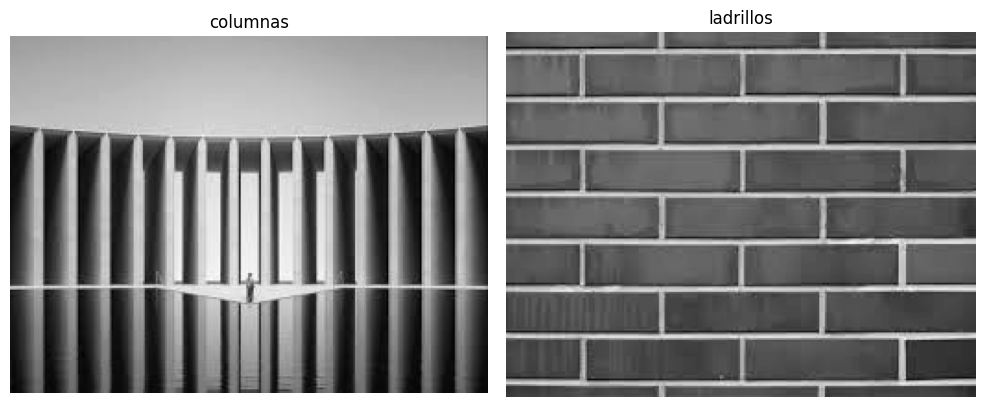

In [34]:
# Reutilizamos las imagenes del notebook anterior
columnas = cv2.imread('./data/columnas.jpg')
columnas_gray = cv2.cvtColor(columnas, cv2.COLOR_BGR2GRAY)
ladrillos = cv2.imread('./data/ladrillos.jpg')
ladrillos_gray = cv2.cvtColor(ladrillos, cv2.COLOR_BGR2GRAY)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(columnas_gray, cmap='gray')
axes[0].set_title('columnas')
axes[0].axis('off')
axes[1].imshow(ladrillos_gray, cmap='gray')
axes[1].set_title('ladrillos')
axes[1].axis('off')
plt.tight_layout()
plt.show()

### Imágenes sintéticas para matching

Para los ejercicios de matching necesitamos pares de imágenes de la misma escena. Generamos variantes de `columnas.jpg` con distintas transformaciones.

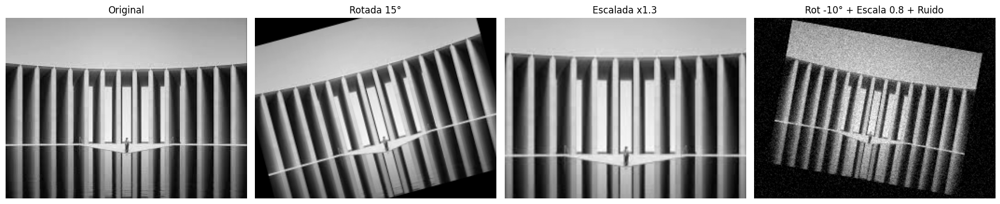

In [35]:
h, w = columnas_gray.shape
centro = (w // 2, h // 2)

# Version rotada 15 grados
M_rot = cv2.getRotationMatrix2D(centro, 15, 1.0)
columnas_rotada = cv2.warpAffine(columnas_gray, M_rot, (w, h))

# Version escalada (zoom in al centro)
M_scale = cv2.getRotationMatrix2D(centro, 0, 1.3)
columnas_escalada = cv2.warpAffine(columnas_gray, M_scale, (w, h))

# Version con rotacion + escala + ruido (mas desafiante)
M_combo = cv2.getRotationMatrix2D(centro, -10, 0.8)
columnas_combo = cv2.warpAffine(columnas_gray, M_combo, (w, h))
ruido = np.random.normal(0, 15, columnas_combo.shape).astype(np.float32)
columnas_combo = np.clip(columnas_combo.astype(np.float32) + ruido, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 4, figsize=(18, 4))
titulos = ['Original', 'Rotada 15°', 'Escalada x1.3', 'Rot -10° + Escala 0.8 + Ruido']
imagenes = [columnas_gray, columnas_rotada, columnas_escalada, columnas_combo]
for i, (img, titulo) in enumerate(zip(imagenes, titulos)):
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(titulo)
    axes[i].axis('off')
plt.tight_layout()
plt.show()

---
# 1. Detector de esquinas de Harris

El detector de Harris busca puntos donde la intensidad cambia fuerte en **ambas** direcciones. Esos puntos suelen ser **esquinas**.

Para cada píxel se analiza cómo cambia la intensidad al mover una ventana chica:
- Cambio **pequeño en todas las direcciones** → zona plana
- Cambio **grande en una dirección** → borde
- Cambio **grande en todas las direcciones** → esquina

Se arma la **matriz de autocorrelación** $M$ con los gradientes:

$$M = \sum_{(x,y) \in W} w(x,y) \begin{bmatrix} I_x^2 & I_x I_y \\ I_x I_y & I_y^2 \end{bmatrix}$$

Y la respuesta de Harris es: $R = det(M) - k \cdot trace(M)^2$

| Valor de R | Qué es |
|---|---|
| Grande y positivo | Esquina |
| Negativo (magnitud grande) | Borde |
| $|R|$ chico | Zona plana |

### Ejemplo: Harris sobre columnas

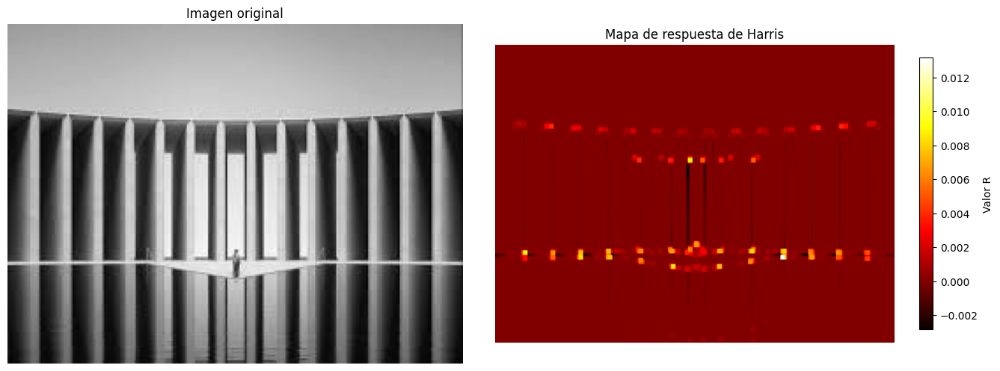

Rango de R: [-0.008679, 0.013165]


In [36]:
# Detectamos esquinas con Harris
# blockSize: tamanio de vecindario para la autocorrelacion
# ksize: apertura del kernel Sobel para calcular gradientes
# k: parametro libre de Harris (tipicamente 0.04 - 0.06)
harris = cv2.cornerHarris(columnas_gray, blockSize=2, ksize=3, k=0.04)

# Dilatamos para que las esquinas sean mas visibles en la visualizacion
harris_dilatado = cv2.dilate(harris, None)

# Mostramos el mapa de respuesta de Harris
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(columnas_gray, cmap='gray')
axes[0].set_title('Imagen original')
axes[0].axis('off')

im = axes[1].imshow(harris_dilatado, cmap='hot')
axes[1].set_title('Mapa de respuesta de Harris')
axes[1].axis('off')
plt.colorbar(im, ax=axes[1], label='Valor R', shrink=0.8)

plt.tight_layout()
plt.show()

print(f'Rango de R: [{harris.min():.6f}, {harris.max():.6f}]')

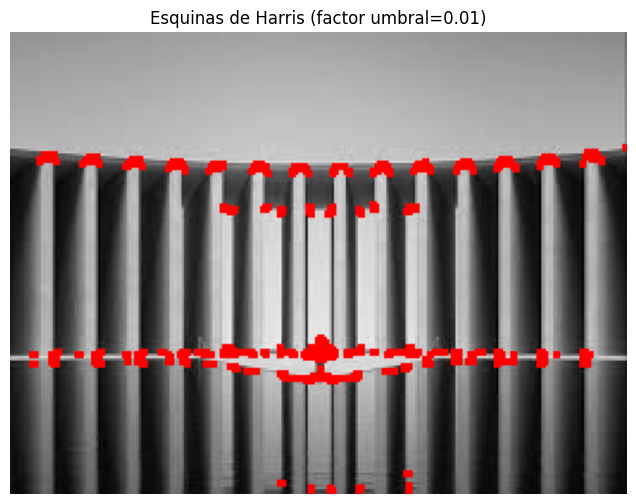

Pixeles clasificados como esquina: 2156


In [37]:
# Marcamos las esquinas detectadas sobre la imagen original
# Usamos un umbral: solo los pixeles con R > umbral * max(R) son esquinas
columnas_harris = cv2.cvtColor(columnas_gray, cv2.COLOR_GRAY2BGR)
umbral_factor = 0.01  # Probar con 0.01, 0.05, 0.1
umbral = umbral_factor * harris_dilatado.max()
columnas_harris[harris_dilatado > umbral] = [0, 0, 255]  # Rojo en BGR

plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(columnas_harris, cv2.COLOR_BGR2RGB))
plt.title(f'Esquinas de Harris (factor umbral={umbral_factor})')
plt.axis('off')
plt.show()

n_esquinas = np.sum(harris_dilatado > umbral)
print(f'Pixeles clasificados como esquina: {n_esquinas}')

### Ejemplo: Efecto del parámetro blockSize

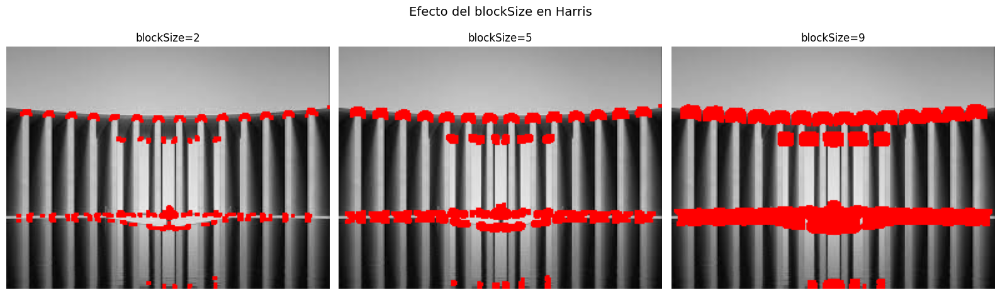

In [38]:
# Comparamos el efecto de distintos blockSize
# blockSize mas grande = considera un vecindario mas amplio
block_sizes = [2, 5, 9]

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
for i, bs in enumerate(block_sizes):
    h_resp = cv2.cornerHarris(columnas_gray, blockSize=bs, ksize=3, k=0.04)
    h_resp = cv2.dilate(h_resp, None)
    
    img_vis = cv2.cvtColor(columnas_gray, cv2.COLOR_GRAY2BGR)
    img_vis[h_resp > 0.01 * h_resp.max()] = [0, 0, 255]
    
    axes[i].imshow(cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f'blockSize={bs}')
    axes[i].axis('off')

plt.suptitle('Efecto del blockSize en Harris', fontsize=14)
plt.tight_layout()
plt.show()

### Ejemplo: Refinamiento sub-píxel con `cornerSubPix`

Una vez detectadas las esquinas, podemos refinar su posición con precisión sub-píxel. Esto es útil para aplicaciones que requieren alta precisión (calibración de cámaras, reconstrucción 3D).

Esquinas detectadas: 58


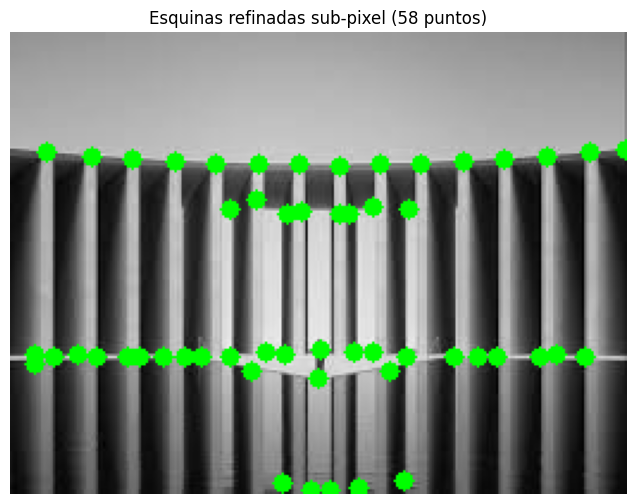

In [39]:
# Obtenemos coordenadas de las esquinas con precision sub-pixel
ret, harris_bin = cv2.threshold(harris_dilatado, umbral, 255, cv2.THRESH_BINARY)
harris_bin = np.uint8(harris_bin)

# Encontramos los centroides de las regiones de esquina
ret, labels, stats, centroids = cv2.connectedComponentsWithStats(harris_bin)

# IMPORTANTE: descartamos el centroide 0 (corresponde al fondo)
centroids_sin_fondo = centroids[1:]

# Refinamos con cornerSubPix
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001)
corners = cv2.cornerSubPix(columnas_gray, np.float32(centroids_sin_fondo), (5, 5), (-1, -1), criteria)

print(f'Esquinas detectadas: {len(corners)}')

# Visualizamos
columnas_subpix = cv2.cvtColor(columnas_gray, cv2.COLOR_GRAY2BGR)
for c in corners:
    x, y = int(round(c[0])), int(round(c[1]))
    cv2.circle(columnas_subpix, (x, y), 4, (0, 255, 0), -1)

plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(columnas_subpix, cv2.COLOR_BGR2RGB))
plt.title(f'Esquinas refinadas sub-pixel ({len(corners)} puntos)')
plt.axis('off')
plt.show()

### Ejercicio 1: Harris sobre ladrillos

1. Aplicar `cv2.cornerHarris()` a `ladrillos_gray`.
2. Crear un grid de `2x3` donde varíen `blockSize` (2, 5, 7) en columnas y `k` (0.04, 0.06) en filas.
3. En cada subplot, marcar las esquinas detectadas en rojo sobre la imagen.
4. Responder: ¿qué combinación de parámetros detecta mejor las esquinas de los ladrillos? ¿Qué pasa con blockSize grandes?

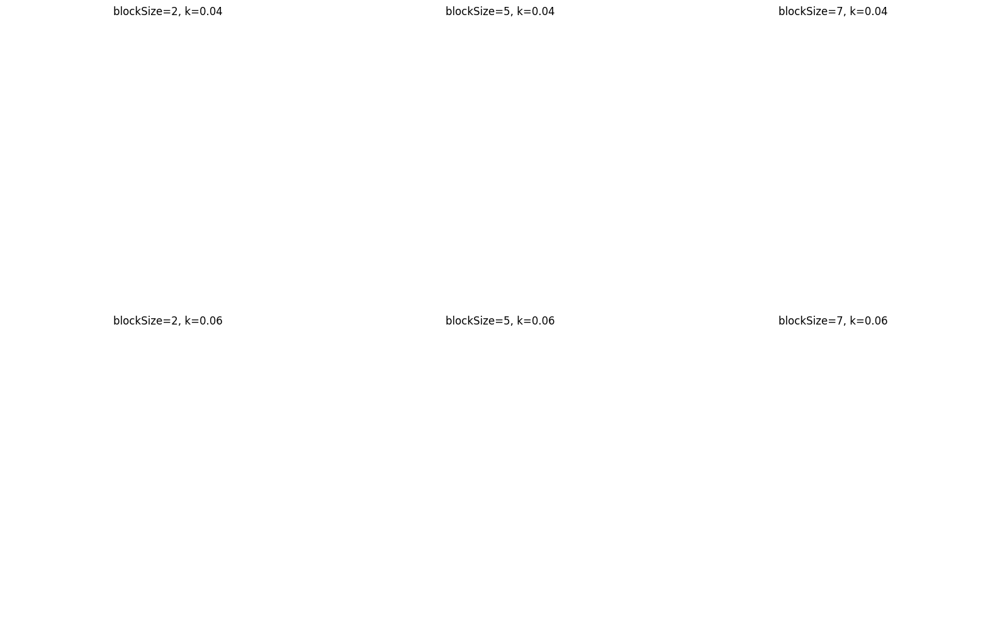

In [40]:
# Ejercicio 1: Completar aqui

block_sizes = [2, 5, 7]
k_values = [0.04, 0.06]

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
for fila, k in enumerate(k_values):
    for col, bs in enumerate(block_sizes):
        # TODO: aplicar cornerHarris con bs y k
        # TODO: dilatar, umbralizar, marcar esquinas en rojo
        # TODO: axes[fila, col].imshow(...)
        axes[fila, col].set_title(f'blockSize={bs}, k={k}')
        axes[fila, col].axis('off')

plt.tight_layout()
plt.show()

### Solución Ejercicio 1

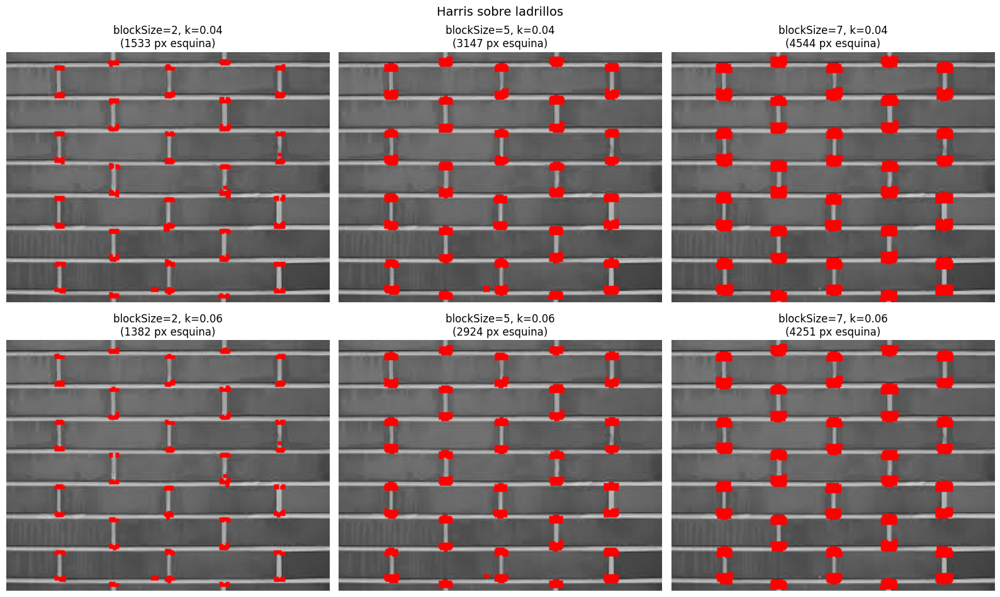

In [41]:
# Solucion Ejercicio 1

block_sizes = [2, 5, 7]
k_values = [0.04, 0.06]

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
for fila, k in enumerate(k_values):
    for col, bs in enumerate(block_sizes):
        harris_resp = cv2.cornerHarris(ladrillos_gray, blockSize=bs, ksize=3, k=k)
        harris_resp = cv2.dilate(harris_resp, None)
        
        img_vis = cv2.cvtColor(ladrillos_gray, cv2.COLOR_GRAY2BGR)
        umbral = 0.01 * harris_resp.max()
        img_vis[harris_resp > umbral] = [0, 0, 255]
        
        n_esquinas = np.sum(harris_resp > umbral)
        axes[fila, col].imshow(cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB))
        axes[fila, col].set_title(f'blockSize={bs}, k={k}\n({n_esquinas} px esquina)')
        axes[fila, col].axis('off')

plt.suptitle('Harris sobre ladrillos', fontsize=14)
plt.tight_layout()
plt.show()

---
# 2. Pirámides de imagen

Las pirámides representan una imagen en **múltiples escalas**. Son la base de algoritmos como SIFT.

**Pirámide Gaussiana:** cada nivel se obtiene suavizando y submuestreando (mitad de resolución). Se pierde detalle fino en cada nivel. Se usa `cv2.pyrDown()` / `cv2.pyrUp()`.

**Pirámide Laplaciana:** cada nivel captura los **detalles que se pierden** entre un nivel gaussiano y el siguiente: $L_i = G_i - \text{pyrUp}(G_{i+1})$. Permite reconstruir la imagen original.

### Ejemplo: Pirámide Gaussiana

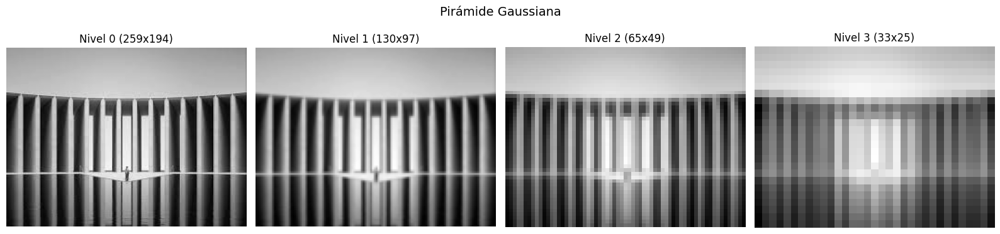

Reduccion de tamaño en cada nivel:
  Nivel 0: 259x194 = 50246 pixeles
  Nivel 1: 130x97 = 12610 pixeles
  Nivel 2: 65x49 = 3185 pixeles
  Nivel 3: 33x25 = 825 pixeles


In [42]:
# Construimos una piramide gaussiana de 4 niveles
piramide_gauss = [columnas_gray]
for i in range(3):
    piramide_gauss.append(cv2.pyrDown(piramide_gauss[-1]))

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for i, nivel in enumerate(piramide_gauss):
    axes[i].imshow(nivel, cmap='gray')
    axes[i].set_title(f'Nivel {i} ({nivel.shape[1]}x{nivel.shape[0]})')
    axes[i].axis('off')
plt.suptitle('Pirámide Gaussiana', fontsize=14)
plt.tight_layout()
plt.show()

print('Reduccion de tamaño en cada nivel:')
for i, nivel in enumerate(piramide_gauss):
    print(f'  Nivel {i}: {nivel.shape[1]}x{nivel.shape[0]} = {nivel.size} pixeles')

### Ejemplo: Pirámide Laplaciana

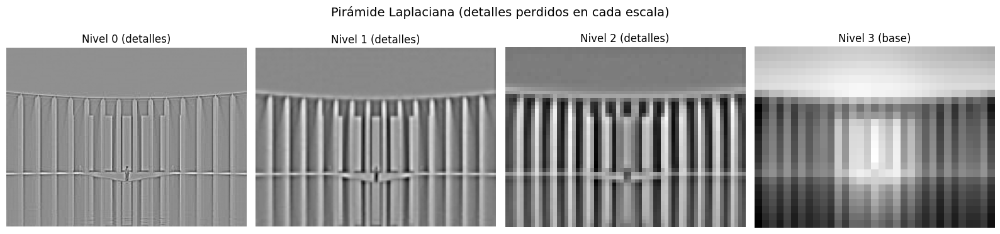

Los niveles Laplacianos capturan bordes y detalles finos.
Nivel 0 - rango: [-130, 99]


In [43]:
# Construimos la piramide Laplaciana
# Cada nivel = nivel_gaussiano - pyrUp(nivel_gaussiano_siguiente)
piramide_laplace = []
for i in range(len(piramide_gauss) - 1):
    expandida = cv2.pyrUp(piramide_gauss[i + 1],
                          dstsize=(piramide_gauss[i].shape[1], piramide_gauss[i].shape[0]))
    # Usamos substraccion con float para capturar valores negativos
    laplaciana = piramide_gauss[i].astype(np.float32) - expandida.astype(np.float32)
    piramide_laplace.append(laplaciana)
# El ultimo nivel de la laplaciana es el ultimo nivel gaussiano
piramide_laplace.append(piramide_gauss[-1].astype(np.float32))

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for i, nivel in enumerate(piramide_laplace[:-1]):
    # Normalizamos para visualizar (los valores pueden ser negativos)
    nivel_vis = cv2.normalize(nivel, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    axes[i].imshow(nivel_vis, cmap='gray')
    axes[i].set_title(f'Nivel {i} (detalles)')
    axes[i].axis('off')
# Ultimo nivel (base)
axes[3].imshow(piramide_laplace[-1].astype(np.uint8), cmap='gray')
axes[3].set_title(f'Nivel {len(piramide_laplace)-1} (base)')
axes[3].axis('off')

plt.suptitle('Pirámide Laplaciana (detalles perdidos en cada escala)', fontsize=14)
plt.tight_layout()
plt.show()

print('Los niveles Laplacianos capturan bordes y detalles finos.')
print(f'Nivel 0 - rango: [{piramide_laplace[0].min():.0f}, {piramide_laplace[0].max():.0f}]')

### Ejercicio 2: Reconstrucción desde pirámide Laplaciana

La pirámide Laplaciana permite reconstruir la imagen original sin pérdida.

**Algoritmo:**
1. Partir del último nivel (base gaussiana).
2. Expandirlo con `cv2.pyrUp()` al tamaño del nivel anterior.
3. Sumarle el nivel Laplaciano correspondiente.
4. Repetir hasta llegar al nivel 0.

**Tareas:**
1. Implementar la reconstrucción recorriendo `piramide_laplace` de atrás hacia adelante.
2. Comparar la imagen reconstruida con `columnas_gray` usando `np.array_equal()` o calculando la diferencia absoluta máxima.
3. Mostrar lado a lado: original, reconstruida, y la diferencia (amplificada x10 para visualizarla).

In [44]:
# Ejercicio 2: Completar aqui

# Paso 1: Empezar con el ultimo nivel
# reconstruida = piramide_laplace[-1].copy()

# Paso 2-3: Recorrer de atras para adelante
# for i in range(len(piramide_laplace) - 2, -1, -1):
#     reconstruida = cv2.pyrUp(reconstruida,
#                               dstsize=(piramide_laplace[i].shape[1], piramide_laplace[i].shape[0]))
#     reconstruida = reconstruida + piramide_laplace[i]

# Paso 4: Convertir a uint8 y comparar
# reconstruida_uint8 = np.clip(reconstruida, 0, 255).astype(np.uint8)
# diff = np.abs(columnas_gray.astype(np.float32) - reconstruida_uint8.astype(np.float32))
# print(f'Diferencia maxima: {diff.max()}')
# print(f'Son iguales: {np.array_equal(columnas_gray, reconstruida_uint8)}')

# Visualizar: original | reconstruida | diferencia x10


### Solución Ejercicio 2

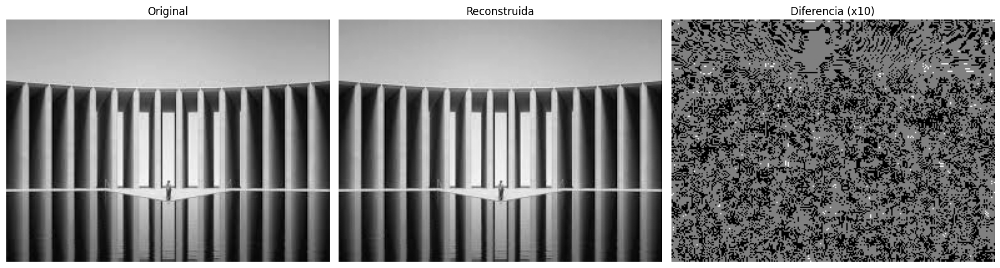

Diferencia maxima: 2.0
Diferencia media: 0.6733
Iguales pixel a pixel: False


In [45]:
# Solucion Ejercicio 2

# Arrancamos del ultimo nivel (la base gaussiana mas chica)
reconstruida = piramide_laplace[-1].copy()

# Vamos subiendo: expandimos y sumamos los detalles laplacianos
for i in range(len(piramide_laplace) - 2, -1, -1):
    reconstruida = cv2.pyrUp(reconstruida,
                              dstsize=(piramide_laplace[i].shape[1], piramide_laplace[i].shape[0]))
    reconstruida = reconstruida + piramide_laplace[i]

reconstruida_uint8 = np.clip(reconstruida, 0, 255).astype(np.uint8)
diff = np.abs(columnas_gray.astype(np.float32) - reconstruida_uint8.astype(np.float32))

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
axes[0].imshow(columnas_gray, cmap='gray')
axes[0].set_title('Original')
axes[0].axis('off')
axes[1].imshow(reconstruida_uint8, cmap='gray')
axes[1].set_title('Reconstruida')
axes[1].axis('off')
axes[2].imshow(diff * 10, cmap='gray')  # x10 para que se vea algo
axes[2].set_title('Diferencia (x10)')
axes[2].axis('off')
plt.tight_layout()
plt.show()

print(f'Diferencia maxima: {diff.max():.1f}')
print(f'Diferencia media: {diff.mean():.4f}')
print(f'Iguales pixel a pixel: {np.array_equal(columnas_gray, reconstruida_uint8)}')

---
# 3. Descriptores: SIFT y ORB

Los **descriptores locales** describen el entorno de cada keypoint para poder reconocerlo en otra imagen, aunque haya transformaciones.

**SIFT** (Lowe, 2004): Usa pirámides de diferencias de Gaussianas (DoG) para detectar keypoints en múltiples escalas. Descriptor de **128 dimensiones** (float32). Robusto a escala, rotación e iluminación. Lento.

**ORB** (Rublee et al., 2011): Usa FAST para keypoints y BRIEF orientado para descriptores. Descriptor **binario de 256 bits**. ~100x más rápido que SIFT. Menos robusto a escala.

| | SIFT | ORB |
|---|---|---|
| Descriptor | Float (128 dim) | Binario (256 bits) |
| Distancia | L2 | Hamming |
| Inv. escala | Sí | Parcial |
| Inv. rotación | Sí | Sí |
| Velocidad | Lento | Rápido |

### Ejemplo: Detección de keypoints con SIFT

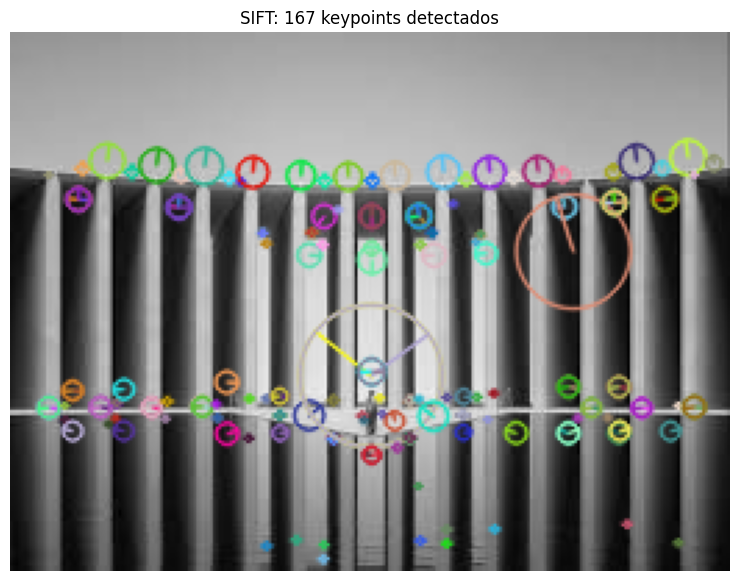

Descriptor shape: (167, 128) -> 167 keypoints x 128 dimensiones
Tipo de dato: float32
Los circulos indican la escala del keypoint, la linea indica la orientacion dominante.


In [46]:
# Creamos el detector SIFT
sift = cv2.SIFT_create()

# Detectamos keypoints y calculamos descriptores
kp_sift, desc_sift = sift.detectAndCompute(columnas_gray, None)

# Dibujamos los keypoints con RICH: muestra tamanio (escala) y orientacion
img_sift = cv2.drawKeypoints(columnas_gray, kp_sift, None,
                              flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10, 7))
plt.imshow(img_sift)
plt.title(f'SIFT: {len(kp_sift)} keypoints detectados')
plt.axis('off')
plt.show()

print(f'Descriptor shape: {desc_sift.shape} -> {desc_sift.shape[0]} keypoints x {desc_sift.shape[1]} dimensiones')
print(f'Tipo de dato: {desc_sift.dtype}')
print(f'Los circulos indican la escala del keypoint, la linea indica la orientacion dominante.')

### Ejemplo: Detección de keypoints con ORB

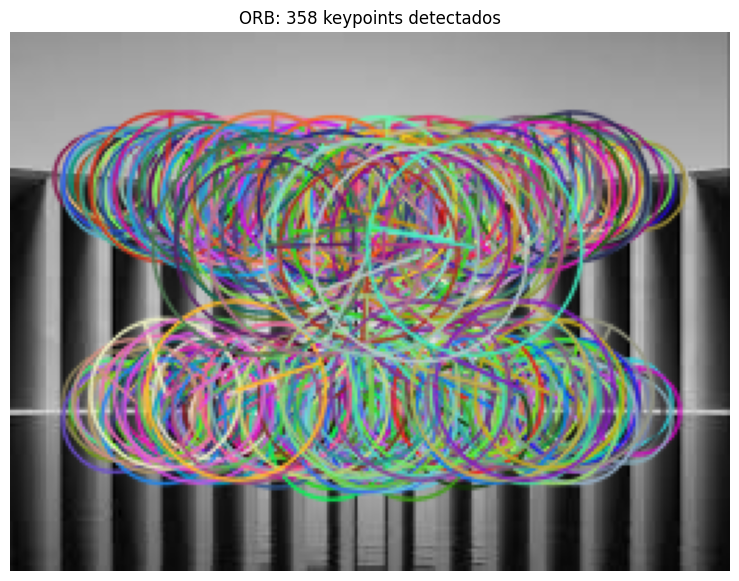

Descriptor shape: (358, 32) -> 358 keypoints x 32 bytes (= 256 bits)
Tipo de dato: uint8


In [47]:
# Creamos el detector ORB (limitamos a 500 features para comparar)
orb = cv2.ORB_create(nfeatures=500)

# Detectamos keypoints y calculamos descriptores
kp_orb, desc_orb = orb.detectAndCompute(columnas_gray, None)

# Dibujamos los keypoints
img_orb = cv2.drawKeypoints(columnas_gray, kp_orb, None,
                             flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10, 7))
plt.imshow(img_orb)
plt.title(f'ORB: {len(kp_orb)} keypoints detectados')
plt.axis('off')
plt.show()

print(f'Descriptor shape: {desc_orb.shape} -> {desc_orb.shape[0]} keypoints x {desc_orb.shape[1]} bytes (= {desc_orb.shape[1]*8} bits)')
print(f'Tipo de dato: {desc_orb.dtype}')

### Ejemplo: Comparación lado a lado SIFT vs ORB

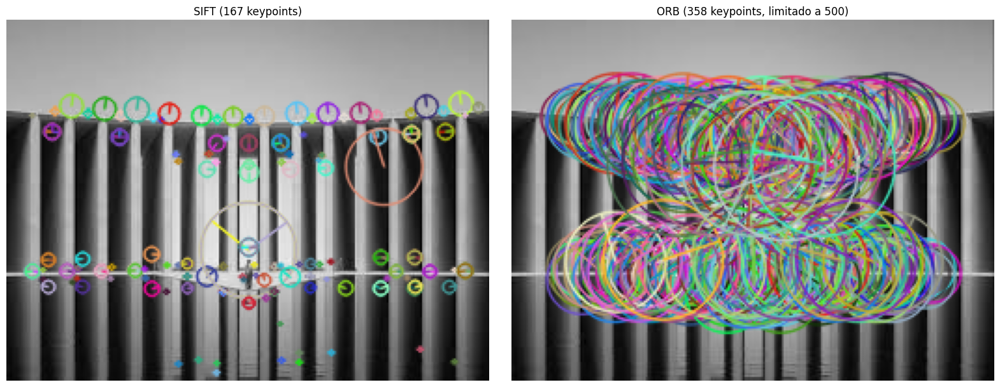

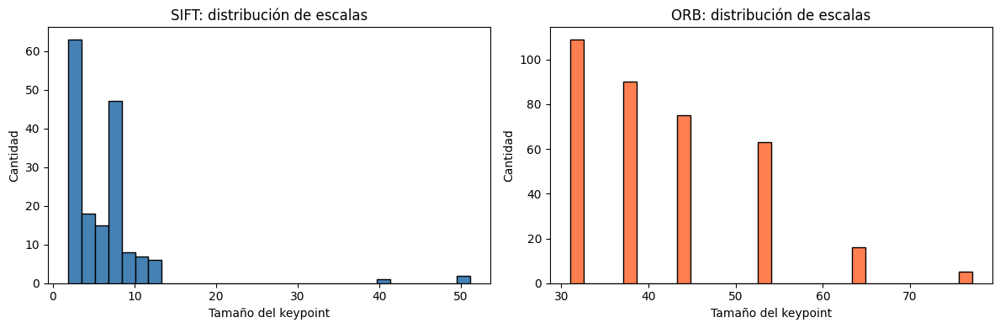

In [48]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].imshow(img_sift)
axes[0].set_title(f'SIFT ({len(kp_sift)} keypoints)')
axes[0].axis('off')

axes[1].imshow(img_orb)
axes[1].set_title(f'ORB ({len(kp_orb)} keypoints, limitado a 500)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Analizamos la distribucion de escalas de SIFT
escalas_sift = [kp.size for kp in kp_sift]
escalas_orb = [kp.size for kp in kp_orb]

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(escalas_sift, bins=30, color='steelblue', edgecolor='black')
axes[0].set_title('SIFT: distribución de escalas')
axes[0].set_xlabel('Tamaño del keypoint')
axes[0].set_ylabel('Cantidad')

axes[1].hist(escalas_orb, bins=30, color='coral', edgecolor='black')
axes[1].set_title('ORB: distribución de escalas')
axes[1].set_xlabel('Tamaño del keypoint')
axes[1].set_ylabel('Cantidad')

plt.tight_layout()
plt.show()

### Ejercicio 3: Comparar SIFT vs ORB en ladrillos

1. Aplicar SIFT y ORB (con `nfeatures=500`) a `ladrillos_gray`.
2. Visualizar los keypoints de ambos lado a lado con `DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.
3. Graficar la distribución de escalas (tamaño) de los keypoints de cada uno usando histogramas.
4. Responder:
   - ¿Cuál detecta más keypoints?
   - ¿Se distribuyen de forma diferente sobre la imagen? ¿Por qué?
   - ¿Qué descriptor cubre mejor las diferentes escalas?

In [49]:
# Ejercicio 3: Completar aqui

# sift = cv2.SIFT_create()
# orb = cv2.ORB_create(nfeatures=500)

# kp_sift_l, desc_sift_l = sift.detectAndCompute(ladrillos_gray, None)
# kp_orb_l, desc_orb_l = orb.detectAndCompute(ladrillos_gray, None)

# TODO: visualizar keypoints lado a lado
# TODO: histogramas de escalas
# TODO: responder preguntas en celda markdown


### Solución Ejercicio 3

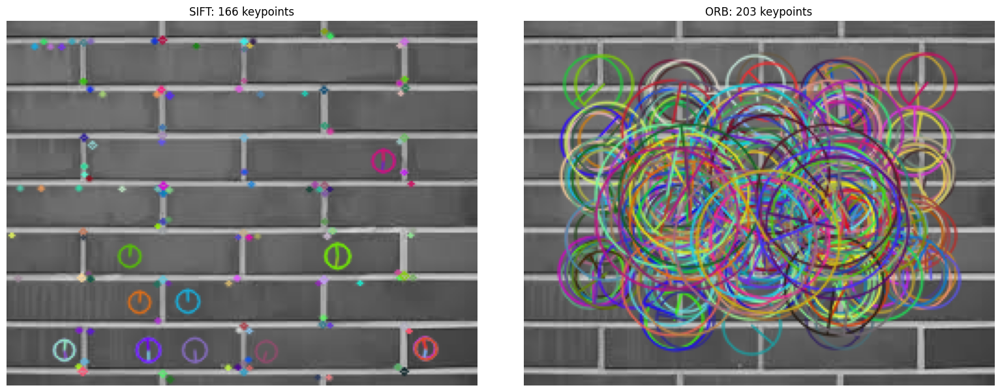

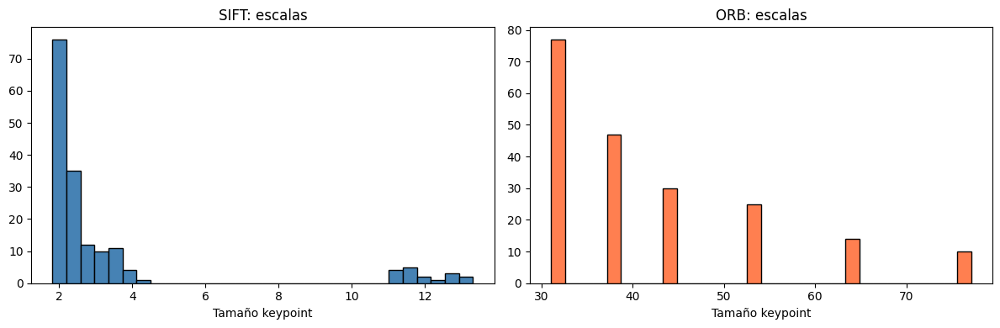

In [50]:
# Solucion Ejercicio 3

sift = cv2.SIFT_create()
orb = cv2.ORB_create(nfeatures=500)

kp_sift_l, desc_sift_l = sift.detectAndCompute(ladrillos_gray, None)
kp_orb_l, desc_orb_l = orb.detectAndCompute(ladrillos_gray, None)

img_sift_l = cv2.drawKeypoints(ladrillos_gray, kp_sift_l, None,
                                flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_orb_l = cv2.drawKeypoints(ladrillos_gray, kp_orb_l, None,
                               flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(img_sift_l)
axes[0].set_title(f'SIFT: {len(kp_sift_l)} keypoints')
axes[0].axis('off')
axes[1].imshow(img_orb_l)
axes[1].set_title(f'ORB: {len(kp_orb_l)} keypoints')
axes[1].axis('off')
plt.tight_layout()
plt.show()

# Distribucion de escalas
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist([kp.size for kp in kp_sift_l], bins=30, color='steelblue', edgecolor='black')
axes[0].set_title('SIFT: escalas')
axes[0].set_xlabel('Tamaño keypoint')
axes[1].hist([kp.size for kp in kp_orb_l], bins=30, color='coral', edgecolor='black')
axes[1].set_title('ORB: escalas')
axes[1].set_xlabel('Tamaño keypoint')
plt.tight_layout()
plt.show()

---
# 4. Feature Matching

El **feature matching** busca correspondencias entre keypoints de dos imágenes comparando sus descriptores.

| Matcher | Para qué descriptores | Cómo funciona |
|---|---|---|
| `BFMatcher(NORM_HAMMING)` | Binarios (ORB) | Compara todos contra todos, distancia Hamming |
| `BFMatcher(NORM_L2)` | Float (SIFT) | Compara todos contra todos, distancia euclidiana |
| `FlannBasedMatcher` (KDTree) | Float (SIFT) | Búsqueda aproximada, más eficiente |

**Ratio test de Lowe:** para cada keypoint buscamos los 2 mejores matches (`knnMatch` con `k=2`). Si el mejor es mucho mejor que el segundo, probablemente sea correcto:

$$\frac{d_1}{d_2} < 0.75 \Rightarrow \text{aceptado}$$

### Ejemplo: BFMatcher + ORB (con crossCheck)

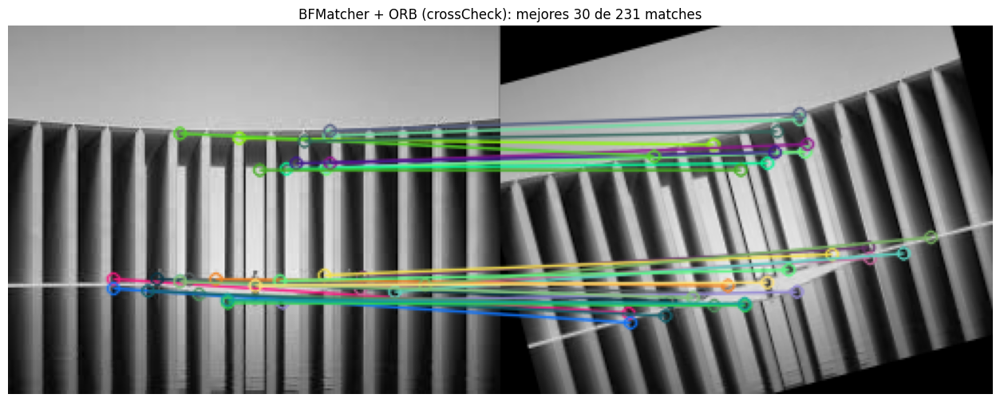

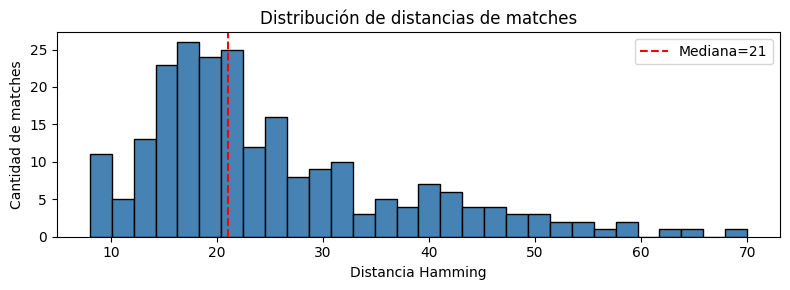

In [51]:
# Detectamos keypoints en la imagen original y la rotada
orb = cv2.ORB_create(nfeatures=500)
kp1, desc1 = orb.detectAndCompute(columnas_gray, None)
kp2, desc2 = orb.detectAndCompute(columnas_rotada, None)

# BFMatcher con distancia Hamming y crossCheck
# crossCheck=True: solo acepta matches mutuos (A->B y B->A coinciden)
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(desc1, desc2)

# Ordenamos por distancia (menor = mejor match)
matches = sorted(matches, key=lambda x: x.distance)

# Dibujamos los mejores 30 matches
img_matches = cv2.drawMatches(columnas_gray, kp1, columnas_rotada, kp2,
                               matches[:30], None,
                               flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(16, 6))
plt.imshow(img_matches)
plt.title(f'BFMatcher + ORB (crossCheck): mejores 30 de {len(matches)} matches')
plt.axis('off')
plt.show()

# Histograma de distancias
distancias = [m.distance for m in matches]
plt.figure(figsize=(8, 3))
plt.hist(distancias, bins=30, color='steelblue', edgecolor='black')
plt.xlabel('Distancia Hamming')
plt.ylabel('Cantidad de matches')
plt.title('Distribución de distancias de matches')
plt.axvline(x=np.median(distancias), color='red', linestyle='--', label=f'Mediana={np.median(distancias):.0f}')
plt.legend()
plt.tight_layout()
plt.show()

### Ejemplo: FLANN + SIFT con ratio test de Lowe

Keypoints imagen 1: 167
Keypoints imagen 2: 185
Matches totales: 167
Matches buenos (ratio test < 0.75): 100
Porcentaje filtrado: 59.9%


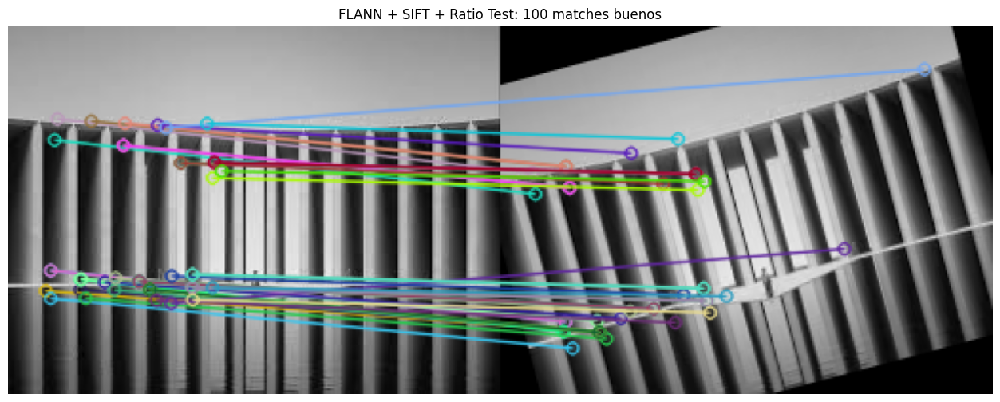

In [52]:
# Detectamos keypoints con SIFT
sift = cv2.SIFT_create()
kp1_s, desc1_s = sift.detectAndCompute(columnas_gray, None)
kp2_s, desc2_s = sift.detectAndCompute(columnas_rotada, None)

# FLANN con KDTree para descriptores float (SIFT)
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# knnMatch devuelve los 2 mejores matches para cada descriptor
matches_knn = flann.knnMatch(desc1_s, desc2_s, k=2)

# Aplicamos ratio test de Lowe (ratio = 0.75)
buenos = []
for m, n in matches_knn:
    if m.distance < 0.75 * n.distance:
        buenos.append(m)

print(f'Keypoints imagen 1: {len(kp1_s)}')
print(f'Keypoints imagen 2: {len(kp2_s)}')
print(f'Matches totales: {len(matches_knn)}')
print(f'Matches buenos (ratio test < 0.75): {len(buenos)}')
print(f'Porcentaje filtrado: {len(buenos)/len(matches_knn)*100:.1f}%')

# Dibujamos los matches buenos
img_flann = cv2.drawMatches(columnas_gray, kp1_s, columnas_rotada, kp2_s,
                             buenos[:40], None,
                             flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(16, 6))
plt.imshow(img_flann)
plt.title(f'FLANN + SIFT + Ratio Test: {len(buenos)} matches buenos')
plt.axis('off')
plt.show()

### Ejemplo: Visualizar matches buenos vs malos

Los matches buenos tienen líneas consistentes (paralelas, coherentes con la transformación). Los malos cruzan de forma errática.

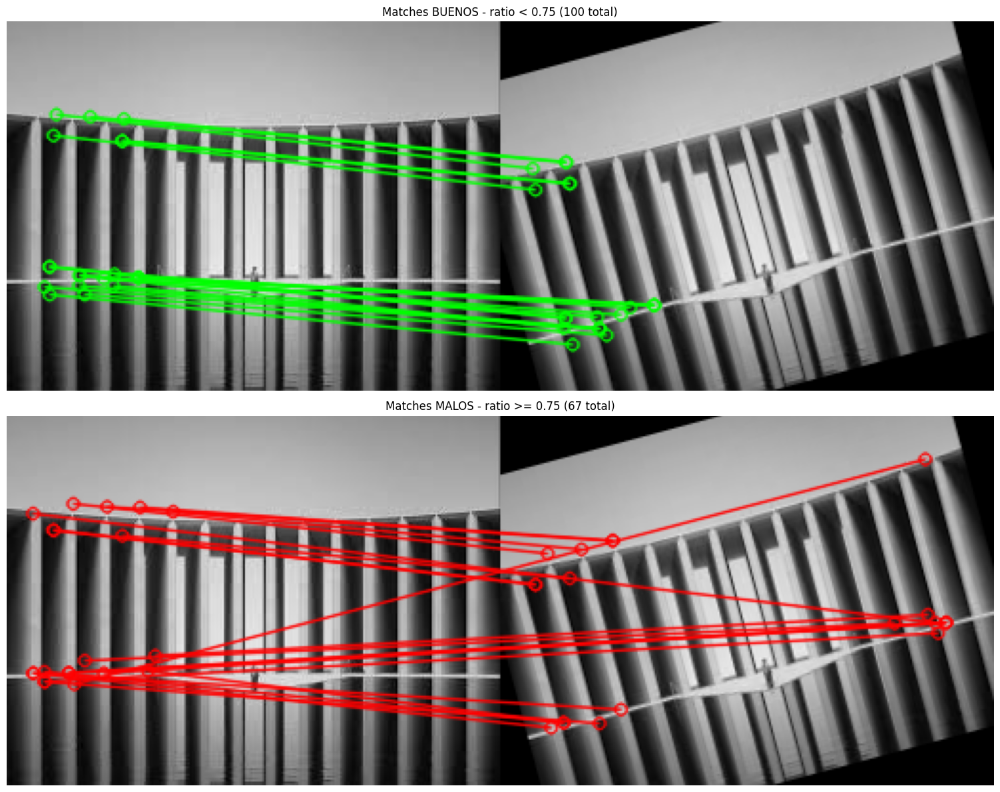

Distancia promedio matches buenos: 75.51
Distancia promedio matches malos: 193.41


In [53]:
# Separamos matches buenos y malos
malos = []
for m, n in matches_knn:
    if m.distance >= 0.75 * n.distance:
        malos.append(m)

fig, axes = plt.subplots(2, 1, figsize=(16, 12))

# Buenos (verde)
img_buenos = cv2.drawMatches(columnas_gray, kp1_s, columnas_rotada, kp2_s,
                              buenos[:20], None,
                              matchColor=(0, 255, 0),
                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
axes[0].imshow(img_buenos)
axes[0].set_title(f'Matches BUENOS - ratio < 0.75 ({len(buenos)} total)')
axes[0].axis('off')

# Malos (rojo) - notar como las lineas cruzan de forma inconsistente
img_malos = cv2.drawMatches(columnas_gray, kp1_s, columnas_rotada, kp2_s,
                             malos[:20], None,
                             matchColor=(255, 0, 0),
                             flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
axes[1].imshow(img_malos)
axes[1].set_title(f'Matches MALOS - ratio >= 0.75 ({len(malos)} total)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Comparamos distancias promedio
print(f'Distancia promedio matches buenos: {np.mean([m.distance for m in buenos]):.2f}')
print(f'Distancia promedio matches malos: {np.mean([m.distance for m in malos]):.2f}')

### Ejercicio 4: Matching entre original y escalada

1. Usar SIFT + FLANN con ratio test (0.75) entre `columnas_gray` y `columnas_escalada`.
2. Usar ORB + BFMatcher con `knnMatch` (sin crossCheck) y ratio test entre las mismas imágenes.
   - **Nota:** para ORB con knnMatch, usar `cv2.BFMatcher(cv2.NORM_HAMMING)` sin `crossCheck=True`.
3. Para cada uno, reportar:
   - Cantidad de keypoints detectados en cada imagen.
   - Matches totales y matches buenos (post ratio test).
   - Porcentaje de supervivencia.
4. Visualizar los mejores 30 matches de cada uno.
5. Responder: ¿cuál descriptor produce más matches correctos ante cambio de escala? ¿Era esperable? ¿Por qué?

In [54]:
# Ejercicio 4: Completar aqui

# --- SIFT + FLANN ---
# sift = cv2.SIFT_create()
# kp1_s, d1_s = sift.detectAndCompute(columnas_gray, None)
# kp2_s, d2_s = sift.detectAndCompute(columnas_escalada, None)
# TODO: configurar FLANN, hacer knnMatch, aplicar ratio test

# --- ORB + BFMatcher ---
# orb = cv2.ORB_create(nfeatures=500)
# kp1_o, d1_o = orb.detectAndCompute(columnas_gray, None)
# kp2_o, d2_o = orb.detectAndCompute(columnas_escalada, None)
# bf = cv2.BFMatcher(cv2.NORM_HAMMING)  # SIN crossCheck para poder usar knnMatch
# TODO: hacer knnMatch con k=2, aplicar ratio test

# TODO: reportar estadisticas y visualizar


### Solución Ejercicio 4

--- SIFT + FLANN ---
KP: 167 / 190 | Matches: 167 | Buenos: 92 (55.1%)

--- ORB + BFMatcher ---
KP: 358 / 298 | Matches: 358 | Buenos: 72 (20.1%)


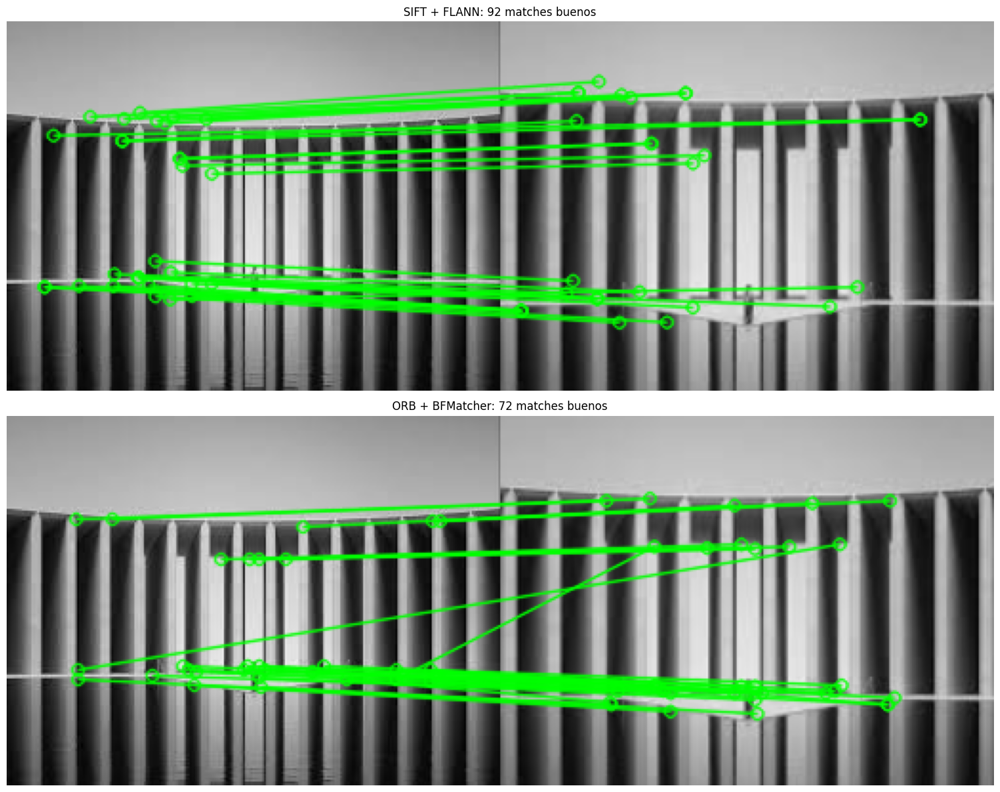

In [55]:
# Solucion Ejercicio 4

# --- SIFT + FLANN ---
sift = cv2.SIFT_create()
kp1_s, d1_s = sift.detectAndCompute(columnas_gray, None)
kp2_s, d2_s = sift.detectAndCompute(columnas_escalada, None)

FLANN_INDEX_KDTREE = 1
flann = cv2.FlannBasedMatcher(dict(algorithm=FLANN_INDEX_KDTREE, trees=5), dict(checks=50))
matches_sift = flann.knnMatch(d1_s, d2_s, k=2)

buenos_sift = [m for m, n in matches_sift if m.distance < 0.75 * n.distance]

print('--- SIFT + FLANN ---')
print(f'KP: {len(kp1_s)} / {len(kp2_s)} | Matches: {len(matches_sift)} | Buenos: {len(buenos_sift)} ({len(buenos_sift)/len(matches_sift)*100:.1f}%)')

# --- ORB + BFMatcher ---
orb = cv2.ORB_create(nfeatures=500)
kp1_o, d1_o = orb.detectAndCompute(columnas_gray, None)
kp2_o, d2_o = orb.detectAndCompute(columnas_escalada, None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING)  # sin crossCheck para poder usar knnMatch
matches_orb = bf.knnMatch(d1_o, d2_o, k=2)

buenos_orb = [m for m, n in matches_orb if len([m, n]) == 2 and m.distance < 0.75 * n.distance]
pares_validos_orb = sum(1 for p in matches_orb if len(p) == 2)

print('\n--- ORB + BFMatcher ---')
print(f'KP: {len(kp1_o)} / {len(kp2_o)} | Matches: {pares_validos_orb} | Buenos: {len(buenos_orb)} ({len(buenos_orb)/max(pares_validos_orb,1)*100:.1f}%)')

# Visualizacion
fig, axes = plt.subplots(2, 1, figsize=(16, 12))

img_match_sift = cv2.drawMatches(columnas_gray, kp1_s, columnas_escalada, kp2_s,
                                  buenos_sift[:30], None, matchColor=(0, 255, 0),
                                  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
axes[0].imshow(img_match_sift)
axes[0].set_title(f'SIFT + FLANN: {len(buenos_sift)} matches buenos')
axes[0].axis('off')

img_match_orb = cv2.drawMatches(columnas_gray, kp1_o, columnas_escalada, kp2_o,
                                 buenos_orb[:30], None, matchColor=(0, 255, 0),
                                 flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
axes[1].imshow(img_match_orb)
axes[1].set_title(f'ORB + BFMatcher: {len(buenos_orb)} matches buenos')
axes[1].axis('off')
plt.tight_layout()
plt.show()

---
# 5. Template Matching

El **template matching** desliza una imagen chica (template) por toda la imagen y calcula una medida de similitud en cada posición. Es simple pero **no** es invariante a escala ni rotación.

| Método | Mejor match | Rango |
|---|---|---|
| `TM_CCOEFF_NORMED` | Máximo (→1) | [-1, 1] |
| `TM_CCORR_NORMED` | Máximo (→1) | [0, 1] |
| `TM_SQDIFF_NORMED` | Mínimo (→0) | [0, 1] |

### Preparación: recortamos un template de la imagen

Para hacer el ejemplo menos trivial, le agregamos un leve desenfoque al template para simular una captura diferente.

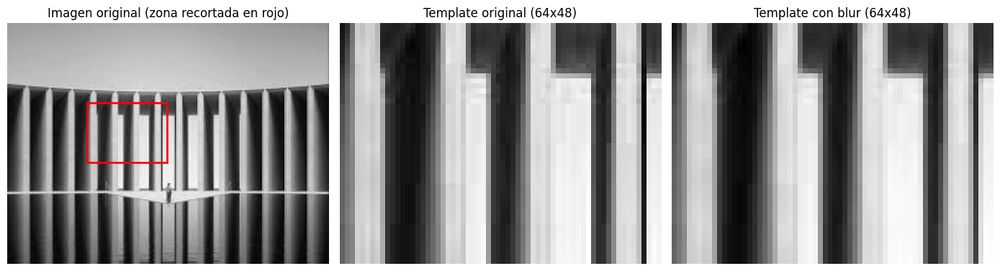

In [56]:
# Recortamos una region de columnas como template
h, w = columnas_gray.shape
y1, y2 = h // 3, h // 3 + h // 4
x1, x2 = w // 4, w // 4 + w // 4
template = columnas_gray[y1:y2, x1:x2].copy()

# Le agregamos un leve desenfoque para simular una captura diferente
template_blur = cv2.GaussianBlur(template, (3, 3), 0.5)

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
axes[0].imshow(columnas_gray, cmap='gray')
rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='red', facecolor='none')
axes[0].add_patch(rect)
axes[0].set_title('Imagen original (zona recortada en rojo)')
axes[0].axis('off')

axes[1].imshow(template, cmap='gray')
axes[1].set_title(f'Template original ({template.shape[1]}x{template.shape[0]})')
axes[1].axis('off')

axes[2].imshow(template_blur, cmap='gray')
axes[2].set_title(f'Template con blur ({template_blur.shape[1]}x{template_blur.shape[0]})')
axes[2].axis('off')

plt.tight_layout()
plt.show()

### Ejemplo: Buscar template con `matchTemplate`

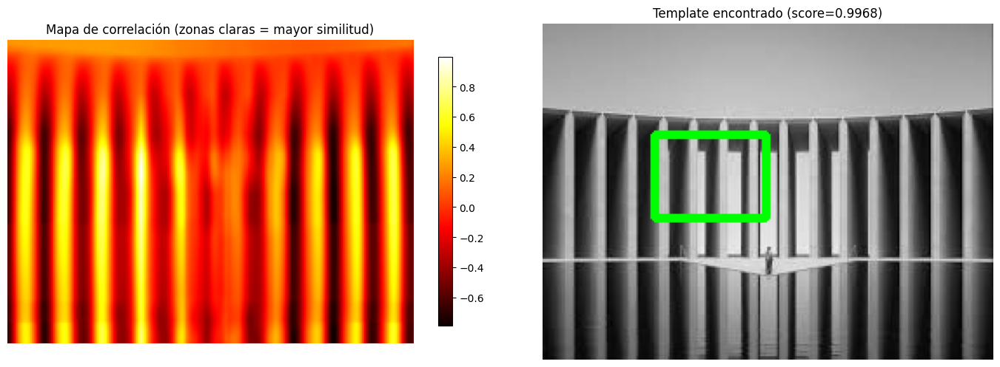

Posicion encontrada: (64, 64)
Posicion real del recorte: (64, 64)
Error en pixeles: (0, 0)


In [57]:
# Aplicamos template matching con el template desenfocado
resultado = cv2.matchTemplate(columnas_gray, template_blur, cv2.TM_CCOEFF_NORMED)

# Encontramos la posicion del maximo
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(resultado)

# Para TM_CCOEFF_NORMED, el maximo es la mejor coincidencia
th, tw = template_blur.shape
top_left = max_loc
bottom_right = (top_left[0] + tw, top_left[1] + th)

# Dibujamos el resultado
img_resultado = cv2.cvtColor(columnas_gray, cv2.COLOR_GRAY2BGR)
cv2.rectangle(img_resultado, top_left, bottom_right, (0, 255, 0), 3)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

im = axes[0].imshow(resultado, cmap='hot')
axes[0].set_title('Mapa de correlación (zonas claras = mayor similitud)')
axes[0].axis('off')
plt.colorbar(im, ax=axes[0], shrink=0.8)

axes[1].imshow(cv2.cvtColor(img_resultado, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'Template encontrado (score={max_val:.4f})')
axes[1].axis('off')

plt.tight_layout()
plt.show()

print(f'Posicion encontrada: ({top_left[0]}, {top_left[1]})')
print(f'Posicion real del recorte: ({x1}, {y1})')
print(f'Error en pixeles: ({abs(top_left[0]-x1)}, {abs(top_left[1]-y1)})')

### Ejemplo: Comparar métodos de template matching

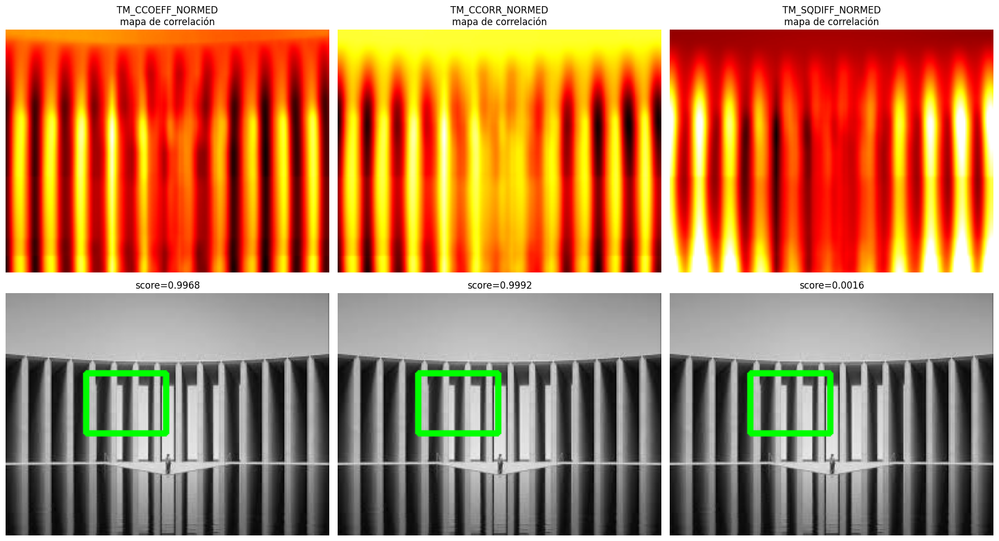

In [58]:
metodos = [
    ('TM_CCOEFF_NORMED', cv2.TM_CCOEFF_NORMED),
    ('TM_CCORR_NORMED', cv2.TM_CCORR_NORMED),
    ('TM_SQDIFF_NORMED', cv2.TM_SQDIFF_NORMED),
]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for i, (nombre, metodo) in enumerate(metodos):
    res = cv2.matchTemplate(columnas_gray, template_blur, metodo)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # Para SQDIFF el minimo es la mejor coincidencia
    if metodo == cv2.TM_SQDIFF_NORMED:
        best_loc = min_loc
        score = min_val
    else:
        best_loc = max_loc
        score = max_val

    bottom_right = (best_loc[0] + tw, best_loc[1] + th)

    # Fila 1: mapa de correlacion
    axes[0, i].imshow(res, cmap='hot')
    axes[0, i].set_title(f'{nombre}\nmapa de correlación')
    axes[0, i].axis('off')

    # Fila 2: resultado sobre imagen
    img_m = cv2.cvtColor(columnas_gray, cv2.COLOR_GRAY2BGR)
    cv2.rectangle(img_m, best_loc, bottom_right, (0, 255, 0), 3)
    axes[1, i].imshow(cv2.cvtColor(img_m, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f'score={score:.4f}')
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

### Ejercicio 5: Múltiples ocurrencias con template matching

El template matching puede encontrar **múltiples** coincidencias umbralizando el mapa de correlación.

**Pasos concretos:**
1. Recortar un ladrillo individual de `ladrillos_gray` como template (elegir coordenadas manualmente mirando la imagen).
2. Aplicar `cv2.matchTemplate()` con `TM_CCOEFF_NORMED`.
3. Umbralizar el resultado con `np.where(resultado >= 0.8)` para obtener coordenadas `(y, x)` de cada coincidencia.
4. Dibujar rectángulos verdes en todas las posiciones encontradas.
5. Experimentar con el valor de umbral (0.7, 0.8, 0.9). ¿Qué pasa con cada uno?

**Ayuda:**
```python
loc = np.where(resultado >= umbral)
for pt in zip(*loc[::-1]):  # loc devuelve (filas, cols), zip lo invierte a (x, y)
    cv2.rectangle(img, pt, (pt[0] + tw, pt[1] + th), (0, 255, 0), 2)
```

In [59]:
# Ejercicio 5: Completar aqui

# Paso 1: Recortar un ladrillo (ajustar coordenadas segun la imagen)
# Para encontrar buenas coordenadas, primero visualizar ladrillos_gray
# y elegir un ladrillo con:
# template_ladrillo = ladrillos_gray[y1:y2, x1:x2]

# Paso 2: Template matching
# resultado = cv2.matchTemplate(ladrillos_gray, template_ladrillo, cv2.TM_CCOEFF_NORMED)

# Paso 3-4: Umbralizar y dibujar
# umbral = 0.8
# loc = np.where(resultado >= umbral)
# img_vis = cv2.cvtColor(ladrillos_gray, cv2.COLOR_GRAY2BGR)
# th, tw = template_ladrillo.shape
# for pt in zip(*loc[::-1]):
#     cv2.rectangle(img_vis, pt, (pt[0] + tw, pt[1] + th), (0, 255, 0), 2)
# print(f'Coincidencias encontradas: {len(loc[0])}')


### Solución Ejercicio 5

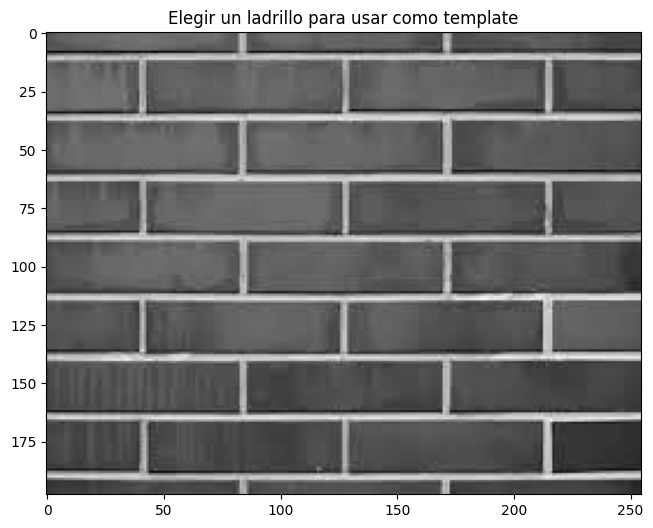

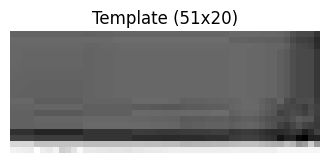

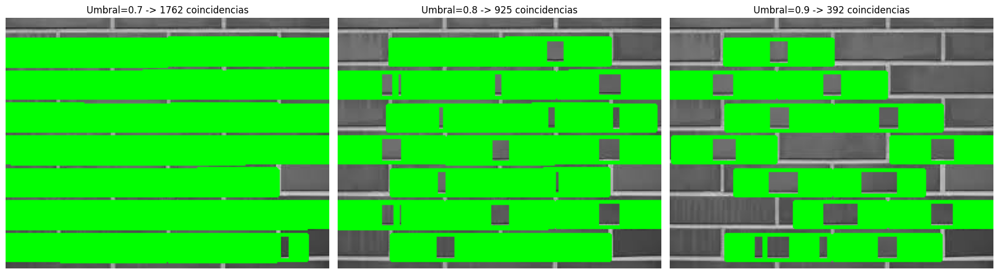

In [60]:
# Solucion Ejercicio 5

# Primero miramos la imagen para elegir un ladrillo
plt.figure(figsize=(8, 6))
plt.imshow(ladrillos_gray, cmap='gray')
plt.title('Elegir un ladrillo para usar como template')
plt.axis('on')  # dejamos ejes para ver coordenadas
plt.show()

# Recortamos un ladrillo (estos valores hay que ajustarlos mirando la imagen!)
# Tip: pasar el mouse sobre la imagen en jupyter para ver coords
hl, wl = ladrillos_gray.shape
# Una zona del centro que deberia tener un ladrillo entero
y1_l, y2_l = int(hl * 0.35), int(hl * 0.45)
x1_l, x2_l = int(wl * 0.30), int(wl * 0.50)
template_ladrillo = ladrillos_gray[y1_l:y2_l, x1_l:x2_l]

plt.figure(figsize=(4, 3))
plt.imshow(template_ladrillo, cmap='gray')
plt.title(f'Template ({template_ladrillo.shape[1]}x{template_ladrillo.shape[0]})')
plt.axis('off')
plt.show()

# Template matching
resultado = cv2.matchTemplate(ladrillos_gray, template_ladrillo, cv2.TM_CCOEFF_NORMED)

# Probamos distintos umbrales
umbrales_tm = [0.7, 0.8, 0.9]
th_l, tw_l = template_ladrillo.shape

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for i, umbral in enumerate(umbrales_tm):
    loc = np.where(resultado >= umbral)
    img_vis = cv2.cvtColor(ladrillos_gray, cv2.COLOR_GRAY2BGR)
    for pt in zip(*loc[::-1]):
        cv2.rectangle(img_vis, pt, (pt[0] + tw_l, pt[1] + th_l), (0, 255, 0), 2)
    
    axes[i].imshow(cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f'Umbral={umbral} -> {len(loc[0])} coincidencias')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

---
# Consigna integradora

## Ejercicio 6: Análisis comparativo de descriptores bajo distintas transformaciones

Realizar un análisis comparativo entre SIFT y ORB para el matching entre `columnas_gray` y las 3 transformaciones disponibles: `columnas_rotada`, `columnas_escalada` y `columnas_combo`.

**Tareas:**
1. Para cada par (original vs transformada) y cada descriptor (SIFT y ORB):
   - Detectar keypoints y descriptores en ambas imágenes.
   - Realizar matching con `knnMatch` (k=2) usando el matcher adecuado.
   - Aplicar ratio test de Lowe con ratio=0.75.
2. Construir una **tabla resumen** (puede ser con `print`) con estas columnas:

| Transformación | Descriptor | KP img1 | KP img2 | Matches total | Matches buenos | % supervivencia |
|---|---|---|---|---|---|---|
| Rotación 15° | SIFT | ... | ... | ... | ... | ... |
| Rotación 15° | ORB | ... | ... | ... | ... | ... |
| Escala x1.3 | SIFT | ... | ... | ... | ... | ... |
| ... | ... | ... | ... | ... | ... | ... |

3. Visualizar los mejores 20 matches del caso **más difícil** (`columnas_combo`) para SIFT y ORB lado a lado.
4. **Conclusiones** (en celda markdown):
   - ¿Cuál descriptor es más robusto a rotación?
   - ¿Cuál es más robusto a cambio de escala?
   - ¿Cuál mantiene mejor rendimiento con ruido?
   - En qué situaciones prácticas preferirían uno sobre el otro?

**Nota para ORB con knnMatch:** usar `cv2.BFMatcher(cv2.NORM_HAMMING)` sin `crossCheck=True`. Es posible que algunos pares devuelvan menos de 2 matches; filtrar con `if len(pair) == 2`.

In [61]:
# Ejercicio 6: Completar aqui

sift = cv2.SIFT_create()
orb = cv2.ORB_create(nfeatures=500)

# Matchers
# FLANN para SIFT
flann_sift = cv2.FlannBasedMatcher(
    dict(algorithm=1, trees=5),
    dict(checks=50)
)
# BFMatcher para ORB (sin crossCheck para poder usar knnMatch)
bf_orb = cv2.BFMatcher(cv2.NORM_HAMMING)

transformaciones = {
    'Rotación 15°': columnas_rotada,
    'Escala x1.3': columnas_escalada,
    'Rot+Escala+Ruido': columnas_combo,
}

# TODO: para cada transformacion y cada descriptor:
# 1. detectAndCompute en columnas_gray y en la transformada
# 2. knnMatch con k=2
# 3. ratio test (cuidado: para ORB filtrar pares con len(pair)==2)
# 4. guardar resultados en una lista/diccionario

# TODO: imprimir tabla resumen
# TODO: visualizar caso mas dificil


### Solución Ejercicio 6

Transformacion       Desc     KP1   KP2  Matches  Buenos      %
-----------------------------------------------------------------
Rotacion 15°         SIFT     167   185      167      99  59.3%
Rotacion 15°         ORB      358   360      358     206  57.5%
Escala x1.3          SIFT     167   190      167      94  56.3%
Escala x1.3          ORB      358   298      358      72  20.1%
Rot+Esc+Ruido        SIFT     167   341      167      81  48.5%
Rot+Esc+Ruido        ORB      358   394      358      95  26.5%

--- Caso mas dificil: Rot + Escala + Ruido ---


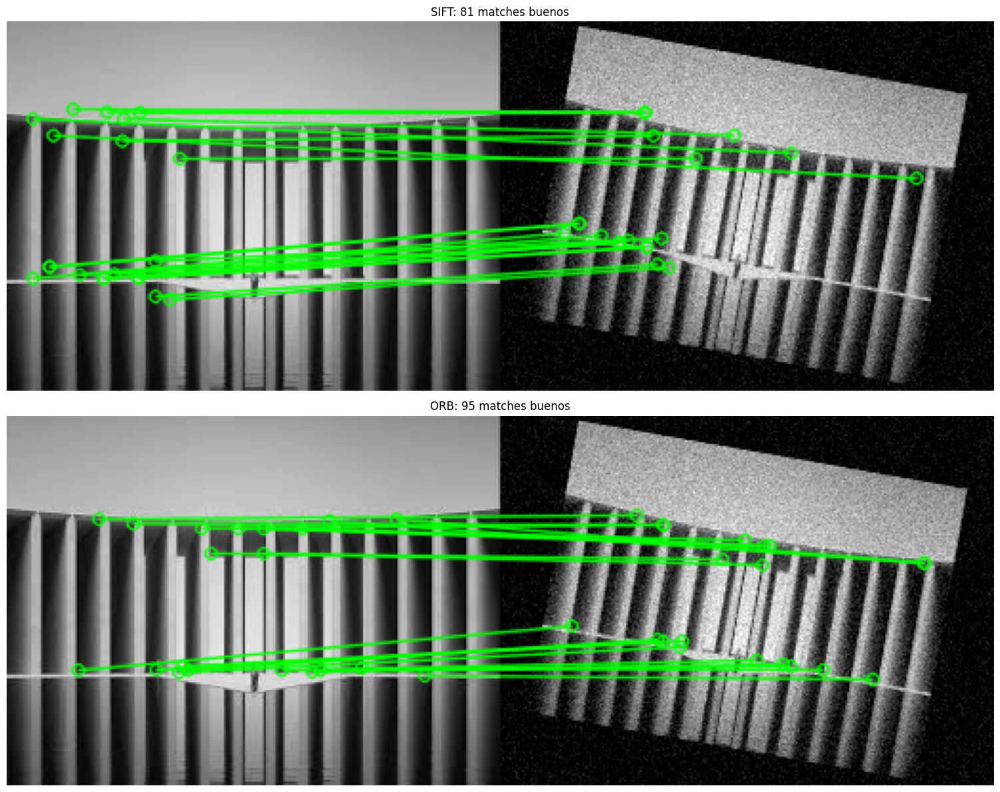

In [62]:
# Solucion Ejercicio 6

sift = cv2.SIFT_create()
orb = cv2.ORB_create(nfeatures=500)

FLANN_INDEX_KDTREE = 1
bf_orb = cv2.BFMatcher(cv2.NORM_HAMMING)

transformaciones = {
    'Rotacion 15°': columnas_rotada,
    'Escala x1.3': columnas_escalada,
    'Rot+Esc+Ruido': columnas_combo,
}

def ratio_test(matches_knn, ratio=0.75):
    """Aplica ratio test de Lowe, filtrando pares incompletos."""
    buenos = []
    for pair in matches_knn:
        if len(pair) == 2:
            m, n = pair
            if m.distance < ratio * n.distance:
                buenos.append(m)
    total_pares = sum(1 for p in matches_knn if len(p) == 2)
    return buenos, total_pares

# Tabla de resultados
print(f'{"Transformacion":<20} {"Desc":<6} {"KP1":>5} {"KP2":>5} {"Matches":>8} {"Buenos":>7} {"%":>6}')
print('-' * 65)

for nombre, img_t in transformaciones.items():
    for desc_nombre, detector in [('SIFT', sift), ('ORB', orb)]:
        kp1, d1 = detector.detectAndCompute(columnas_gray, None)
        kp2, d2 = detector.detectAndCompute(img_t, None)
        
        if d1 is None or d2 is None or len(d1) < 2 or len(d2) < 2:
            print(f'{nombre:<20} {desc_nombre:<6} {len(kp1):>5} {len(kp2):>5} {"--":>8} {"--":>7} {"--":>6}')
            continue
        
        if desc_nombre == 'SIFT':
            flann = cv2.FlannBasedMatcher(dict(algorithm=FLANN_INDEX_KDTREE, trees=5), dict(checks=50))
            mknn = flann.knnMatch(d1, d2, k=2)
        else:
            mknn = bf_orb.knnMatch(d1, d2, k=2)
        
        buenos, total = ratio_test(mknn)
        pct = len(buenos) / total * 100 if total > 0 else 0
        print(f'{nombre:<20} {desc_nombre:<6} {len(kp1):>5} {len(kp2):>5} {total:>8} {len(buenos):>7} {pct:>5.1f}%')

# Visualizamos el caso mas dificil (combo)
print('\n--- Caso mas dificil: Rot + Escala + Ruido ---')

fig, axes = plt.subplots(2, 1, figsize=(16, 12))

# SIFT
kp1_s, d1_s = sift.detectAndCompute(columnas_gray, None)
kp2_s, d2_s = sift.detectAndCompute(columnas_combo, None)
flann_vis = cv2.FlannBasedMatcher(dict(algorithm=FLANN_INDEX_KDTREE, trees=5), dict(checks=50))
buenos_s, _ = ratio_test(flann_vis.knnMatch(d1_s, d2_s, k=2))

img_s = cv2.drawMatches(columnas_gray, kp1_s, columnas_combo, kp2_s,
                         buenos_s[:20], None, matchColor=(0, 255, 0),
                         flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
axes[0].imshow(img_s)
axes[0].set_title(f'SIFT: {len(buenos_s)} matches buenos')
axes[0].axis('off')

# ORB
kp1_o, d1_o = orb.detectAndCompute(columnas_gray, None)
kp2_o, d2_o = orb.detectAndCompute(columnas_combo, None)
buenos_o, _ = ratio_test(bf_orb.knnMatch(d1_o, d2_o, k=2))

img_o = cv2.drawMatches(columnas_gray, kp1_o, columnas_combo, kp2_o,
                         buenos_o[:20], None, matchColor=(0, 255, 0),
                         flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
axes[1].imshow(img_o)
axes[1].set_title(f'ORB: {len(buenos_o)} matches buenos')
axes[1].axis('off')
plt.tight_layout()
plt.show()